# 라이브러리 설정

In [ ]:
!pip install ultralytics

In [2]:
# 표준 라이브러리
import json
import os
import platform
import random
import shutil
import yaml
from collections import Counter, defaultdict

# 데이터 처리 및 시각화
import cv2
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib import rcParams
from PIL import Image, ImageDraw, ImageFont

# PyTorch 관련
import torch
import torch.optim as optim
import torchvision
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image

# 이미지 증강
import albumentations as A
from albumentations.pytorch import ToTensorV2

# 모델
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# 디바이스 설정

In [3]:
# 재현성
def set_seed(seed=42):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True  # 이미지엔 대체로 이게 빠름

set_seed()

In [4]:
# 디바이스 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device: ", device)

device:  cuda


# 데이터 확인

In [6]:
!kaggle competitions download -c ai04-level1-project

 99% 3.89G/3.91G [00:09<00:00, 523MB/s]
100% 3.91G/3.91G [00:09<00:00, 428MB/s]


In [7]:
# data 폴더가 없다면 먼저 생성
!mkdir -p /data

# 다운로드된 zip 파일을 /data 폴더에 압축 해제
!unzip -q /content/ai04-level1-project.zip -d /data

In [8]:
# 경로설정
data_dir = '/data'
annotations_dir = os.path.join(data_dir, 'train_annotations')
train_dir = os.path.join(data_dir, 'train_images')
test_dir = os.path.join(data_dir, 'test_images')

# 이미지 파일 목록
train_images = [f for f in os.listdir(train_dir) if f.endswith('.png')]
print('이미지 개수:', len(train_images))
print('샘플 3개:', train_images[:3])

# 어노테이션 파일 목록
json_files = []
for root, dirs, files in os.walk(annotations_dir):
    for file in files:
        if file.endswith('.json'):
            json_files.append(os.path.join(root, file))
print('어노테이션 파일 개수:', len(json_files))
print('샘플 3개:', json_files[:3])

# json 하나 열어서 구조 확인
with open(json_files[0], 'r', encoding='utf-8') as f:
    data = json.load(f)

print('keys:', data.keys())
print('이미지 수:', len(data['images']))
print('어노테이션 수:', len(data['annotations']))
print('카테고리 수:', len(data['categories']))

# 카테고리 이름(unique class) 확인
categories = pd.DataFrame(data['categories'])
print('유니크 클래스 개수:', categories.shape[0])
print('클래스 이름 예시:', categories.head())

이미지 개수: 1489
샘플 3개: ['K-003483-019861-034597-035206_0_2_0_2_90_000_200.png', 'K-003483-022347-027733-036637_0_2_0_2_75_000_200.png', 'K-002483-005886-023223-025438_0_2_0_2_90_000_200.png']
어노테이션 파일 개수: 4526
샘플 3개: ['/data/train_annotations/K-002483-003743-012081-022627_json/K-022627/K-002483-003743-012081-022627_0_2_0_2_70_000_200.json', '/data/train_annotations/K-002483-003743-012081-022627_json/K-022627/K-002483-003743-012081-022627_0_2_0_2_90_000_200.json', '/data/train_annotations/K-002483-003743-012081-022627_json/K-003743/K-002483-003743-012081-022627_0_2_0_2_70_000_200.json']
keys: dict_keys(['images', 'type', 'annotations', 'categories'])
이미지 수: 1
어노테이션 수: 1
카테고리 수: 1
유니크 클래스 개수: 1
클래스 이름 예시:   supercategory     id          name
0          pill  22626  메가파워정 90mg/병


## 클래스 개수 및 bbox 평균

In [9]:
all_classes = []
all_boxes = []

for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # 카테고리 정보
    for cat in data['categories']:
        all_classes.append(cat['name'])

    # 바운딩 박스 정보
    for ann in data['annotations']:
        if 'bbox' in ann and len(ann['bbox']) == 4:
            all_boxes.append(ann['bbox'])


# 클래스 분포
cls_counter = Counter(all_classes)

print('상위 10개 클래스:', cls_counter.most_common(10))

# 바운딩 박스 크기 분포
widths = [b[2] for b in all_boxes]
heights = [b[3] for b in all_boxes]
print('bbox 평균 크기:', np.mean(widths), np.mean(heights))

상위 10개 클래스: [('기넥신에프정(은행엽엑스)(수출용)', 514), ('일양하이트린정 2mg', 240), ('보령부스파정 5mg', 180), ('뮤테란캡슐 100mg', 172), ('가바토파정 100mg', 143), ('동아가바펜틴정 800mg', 139), ('아토젯정 10/40mg', 113), ('리바로정 4mg', 111), ('리피토정 20mg', 109), ('로수젯정10/5밀리그램', 108)]
bbox 평균 크기: 259.326557666814 288.7459125055236


In [ ]:
# 한글 오류 제거 코드
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

!apt-get update -qq
!apt-get install fonts-nanum* -qq

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import warnings
warnings.filterwarnings(action='ignore')

path = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf' # 나눔 고딕
font_name = fm.FontProperties(fname=path, size=10).get_name() # 기본 폰트 사이즈 : 10
plt.rc('font', family=font_name)

fm.fontManager.addfont(path)

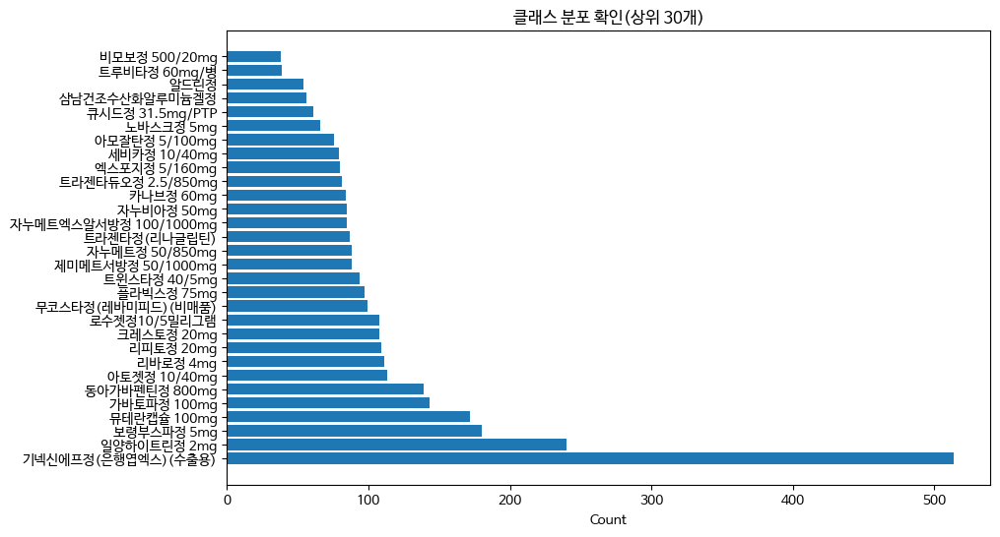

In [ ]:
# 클래스 분포 확인(상위 30개)
top_classes = cls_counter.most_common(30)
names, counts = zip(*top_classes)

plt.figure(figsize=(10,6))
plt.barh(names, counts)
plt.xlabel('Count')
plt.title('클래스 분포 확인(상위 30개)')
plt.show()

## Image Uniqu size 확인

In [11]:
sizes = []
for f in os.listdir(train_dir):
    if f.endswith('.png'):
        path = os.path.join(train_dir, f)
        with Image.open(path) as img:
            sizes.append(img.size)  # (width, height)

# 유니크한 사이즈 종류
unique_sizes = Counter(sizes)

print('총 이미지 개수:', len(sizes))
print('유니크 사이즈 개수:', len(unique_sizes))
print('상위 10개 사이즈:', unique_sizes.most_common(10))

총 이미지 개수: 1489
유니크 사이즈 개수: 1
상위 10개 사이즈: [((976, 1280), 1489)]


## bbox 시각화

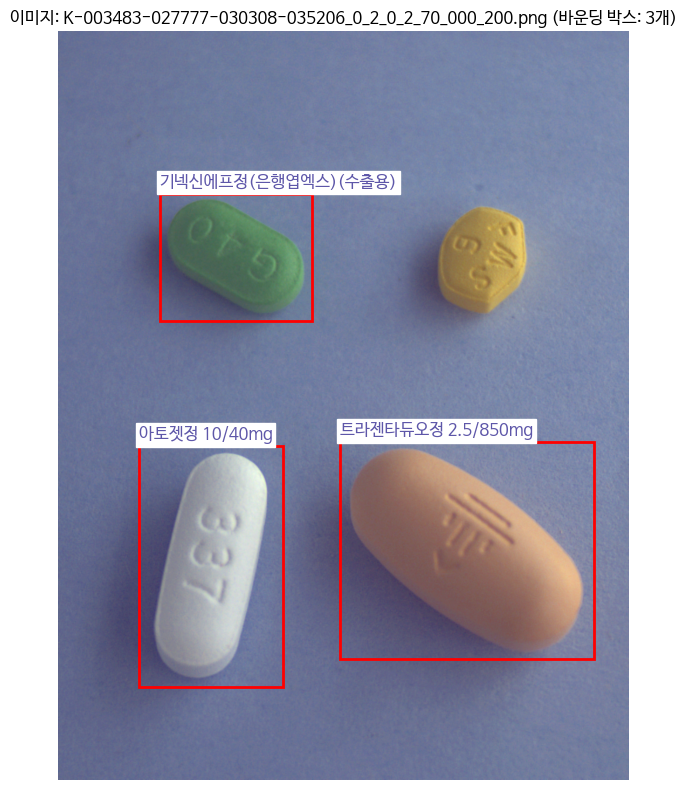

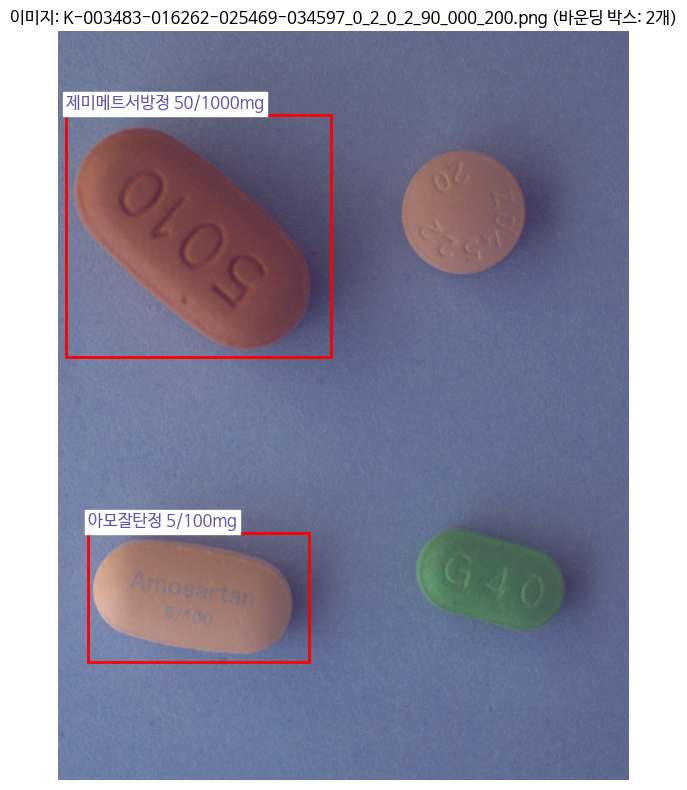

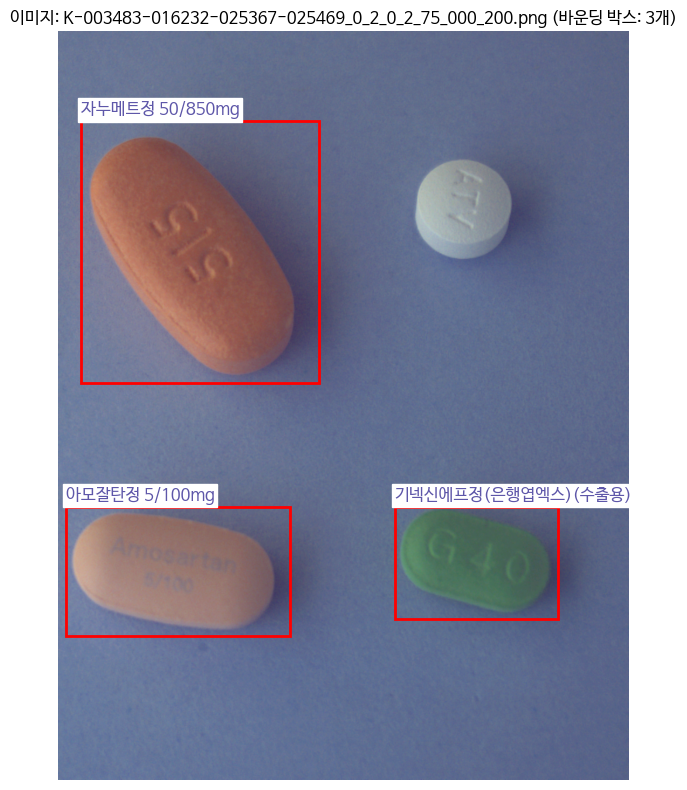

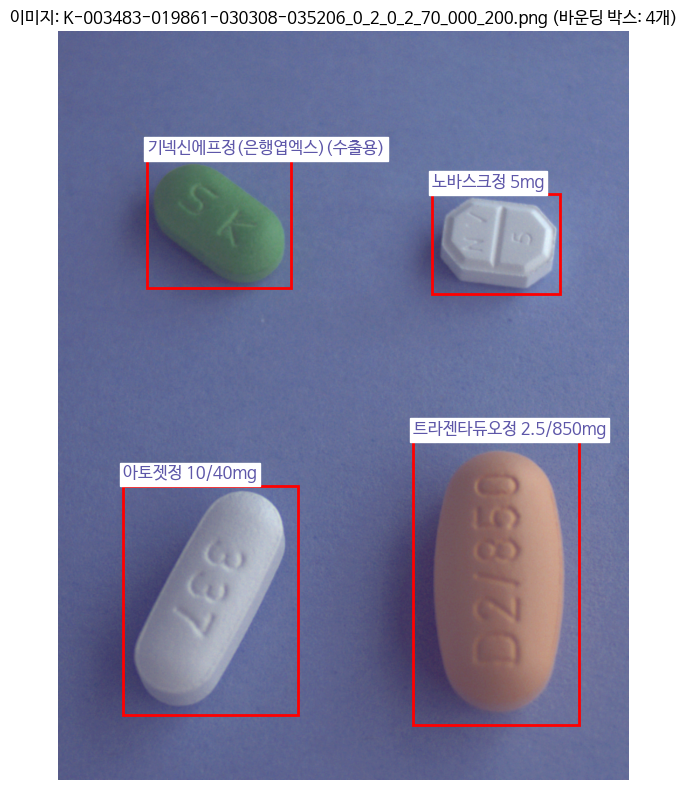

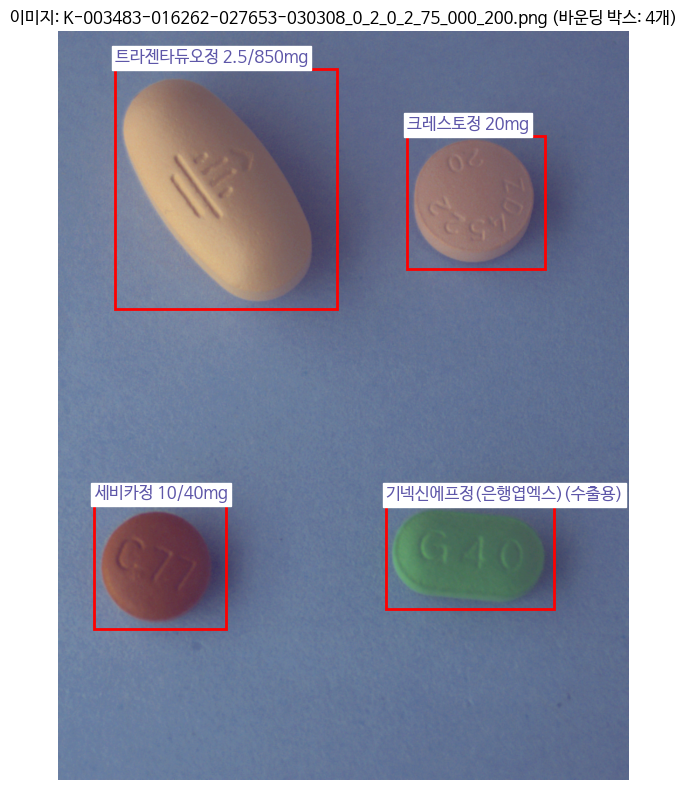

In [12]:
def visualize_pill_dataset(data_dir, json_files, num_samples=5):
    """
    json 파일로 바운딩 박스를 시각화하는 함수

    Args:
        data_dir: 이미지 파일이 있는 디렉토리 경로
        json_files: JSON 파일 경로 리스트
        num_samples: 시각화할 샘플 수 (기본값: 5)
    """
    annotations = defaultdict(list)

    # 각 JSON 파일 처리 -> dict에 [img file_name]을 key로 {어노테이션정보: [바운드박스]}뽑아서 리스트로 저장하기
    for json_path in json_files:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

            file_name = data['images'][0]['file_name']
            bbox = data['annotations'][0]['bbox']
            category_name = data['categories'][0]['name']

            annotations[file_name].append({category_name: bbox})

    items_list = list(annotations.items())
    random.shuffle(items_list)

    # 시각화
    for file_name, anno in items_list[:num_samples]:
        image_path = os.path.join(data_dir, file_name)
        img = Image.open(image_path).convert("RGB")

        fig, ax = plt.subplots(1, figsize=(8, 8))
        ax.imshow(img)

        # 모든 바운딩 박스 그리기
        for a in anno:

            label = list(a.keys())[0]
            bbox = list(a.values())[0]

            x, y, width, height = bbox

            # 바운딩 박스 그리기
            rect = patches.Rectangle(
                (x, y), width, height,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            ax.add_patch(rect)

            # 라벨 텍스트
            ax.text(
                x, y - 12, label,
                fontsize=12, color='#5e57a9',
                bbox=dict(facecolor='white', alpha=1, pad=2, edgecolor='White')
            )

        ax.axis('off')
        plt.title(f"이미지: {file_name} (바운딩 박스: {len(anno)}개)")
        plt.tight_layout()
        plt.show()


visualize_pill_dataset(train_dir, json_files, num_samples=5)

# Yolo용 데이터 리팩토링

In [23]:
# 새 YOLO용 경로
yolo_root = os.path.join(data_dir, 'data_yolo')
img_train_dir = os.path.join(yolo_root, 'images/train')
img_val_dir = os.path.join(yolo_root, 'images/val')

label_root = os.path.join(yolo_root, 'labels')
lbl_train_dir = os.path.join(label_root, 'train')
lbl_val_dir = os.path.join(label_root, 'val')

for d in [img_train_dir, img_val_dir, lbl_train_dir, lbl_val_dir]:
    os.makedirs(d, exist_ok=True)

In [24]:
# 전역 class_map (name → id)
class_map = {}
class_counter = 0
for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        data = json.load(f)
    for cat in data.get('categories', []):
        name = cat['name']
        if name not in class_map:
            class_map[name] = class_counter
            class_counter += 1

sorted_keys = sorted(class_map.keys())
class_map = {key: idx for idx, key in enumerate(sorted_keys)}

print('클래스 개수:', len(class_map))

클래스 개수: 73


In [25]:
# 이미지별 json 묶기
img2json = defaultdict(list)
for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        data = json.load(f)
    img_name = data['images'][0]['file_name']
    img2json[img_name].append(jf)
print('총 이미지 개수:', len(img2json))

총 이미지 개수: 1489


In [26]:
def convert_jsons_to_txt(json_list, save_dir, class_map):
    '''
    YOLO txt 변환 함수
    '''
    if not json_list: return None
    with open(json_list[0], 'r', encoding='utf-8') as f:
        first_data = json.load(f)
    img = first_data['images'][0]
    img_w, img_h = img['width'], img['height']
    img_name = img['file_name']
    label_path = os.path.join(save_dir, img_name.replace('.png', '.txt'))

    yolo_lines = []
    for jf in json_list:
        with open(jf, 'r', encoding='utf-8') as f:
            data = json.load(f)
        id2name = {cat['id']: cat['name'] for cat in data['categories']}
        for ann in data['annotations']:
            if 'bbox' not in ann or len(ann['bbox']) != 4:
                continue
            x, y, w, h = ann['bbox']
            x_center = (x + w / 2) / img_w
            y_center = (y + h / 2) / img_h
            w /= img_w
            h /= img_h

            cat_id = ann['category_id']
            if cat_id not in id2name:
                continue
            name = id2name[cat_id]
            if name not in class_map:
                continue
            cls_id = class_map[name]

            yolo_lines.append(f'{cls_id} {x_center} {y_center} {w} {h}')

    if yolo_lines:
        with open(label_path, 'w', encoding='utf-8') as f:
            f.write('\n'.join(yolo_lines) + '\n')
    return img_name

In [27]:
# 학습/검증 데이터 분할
images = list(img2json.keys())
random.shuffle(images)
split_idx = int(len(images) * 0.8)
train_imgs, val_imgs = images[:split_idx], images[split_idx:]

print('Train 이미지:', len(train_imgs))
print('Val 이미지:', len(val_imgs))

Train 이미지: 1191
Val 이미지: 298


In [28]:
# 변환 및 심볼릭 링크 생성
def symlink(src, dst):
    system = platform.system()

    try:
        if system == 'Windows':
            import subprocess
            subprocess.call(['mklink', '/D', dst, src], shell=True)
        else:  # Unix, Linux, MacOS
            import os
            os.symlink(src, dst)

    except Exception as e:
        print(f"심볼릭 링크 생성 중 오류 발생: {e}")


# train set
for img_name in train_imgs:
    img_src = os.path.join(train_dir, img_name)
    img_dst = os.path.join(img_train_dir, img_name)
    if not os.path.exists(img_dst):
        try:
            symlink(img_src, img_dst)
        except:
            shutil.copy(img_src, img_dst)  # fallback
    convert_jsons_to_txt(img2json[img_name], lbl_train_dir, class_map)

# val set
for img_name in val_imgs:
    img_src = os.path.join(train_dir, img_name)
    img_dst = os.path.join(img_val_dir, img_name)
    if not os.path.exists(img_dst):
        try:
            symlink(img_src, img_dst)
        except:
            shutil.copy(img_src, img_dst)  # fallback
    convert_jsons_to_txt(img2json[img_name], lbl_val_dir, class_map)


print('YOLO data_yolo 준비 완료')
print('data_yolo/images/train:', len(os.listdir(img_train_dir)))
print('data_yolo/labels/train:', len(os.listdir(lbl_train_dir)))
print('data_yolo/images/val:', len(os.listdir(img_val_dir)))
print('data_yolo/labels/val:', len(os.listdir(lbl_val_dir)))

YOLO data_yolo 준비 완료
data_yolo/images/train: 1191
data_yolo/labels/train: 1191
data_yolo/images/val: 298
data_yolo/labels/val: 298


In [29]:
class_ids = set()

for split in ['train', 'val']:
    split_dir = os.path.join(label_root, split)
    for f in os.listdir(split_dir):
        if f.endswith('.txt'):
            with open(os.path.join(split_dir, f), 'r', encoding='utf-8') as ftxt:
                for line in ftxt:
                    cls_id = int(line.split()[0])
                    class_ids.add(cls_id)

print('클래스 개수:', len(class_ids))
print('클래스 ID 목록:', sorted(class_ids))

클래스 개수: 73
클래스 ID 목록: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]


In [30]:
os.makedirs('/configs', exist_ok=True)
yaml_path = '/configs/yolo_data.yaml'

data_yaml = {
    'train': img_train_dir,
    'val': img_val_dir,
    'nc': len(class_map),
    'names': [name for name, _ in sorted(class_map.items(), key=lambda x: x[1])]
}

with open(yaml_path, 'w', encoding='utf-8') as f:
    yaml.dump(data_yaml, f, allow_unicode=True)

print(f'yaml 저장 완료 → {yaml_path}')

yaml 저장 완료 → /configs/yolo_data.yaml


# 데이터 전처리

## bbox 크기

In [31]:
def check_all_labels(label_dir):
    """
    모든 레이블 파일을 검사하여 좌표값이 0~1 범위를 벗어나는지 확인합니다.

    Args:
        label_dir: 레이블 파일이 있는 디렉토리 경로
    """
    invalid_labels = []

    # 레이블 파일 목록 가져오기
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]

    for label_file in label_files:
        label_path = os.path.join(label_dir, label_file)

        # 레이블 파일 읽기
        with open(label_path, 'r') as f:
            labels = f.readlines()

        for line_num, label in enumerate(labels, 1):
            parts = label.strip().split()
            if len(parts) == 5:
                try:
                    class_id = int(parts[0])
                    x_center = float(parts[1])
                    y_center = float(parts[2])
                    width = float(parts[3])
                    height = float(parts[4])

                    # 좌표가 0~1 범위를 벗어나는지 확인
                    if (x_center < 0 or x_center > 1 or
                        y_center < 0 or y_center > 1 or
                        width < 0 or width > 1 or
                        height < 0 or height > 1):
                        invalid_labels.append((label_file, line_num, class_id, x_center, y_center, width, height))
                except ValueError:
                    # 숫자로 변환할 수 없는 경우
                    invalid_labels.append((label_file, line_num, "형식 오류", parts))
            else:
                # 형식이 맞지 않는 경우 (항목이 5개가 아님)
                invalid_labels.append((label_file, line_num, "항목 수 오류", parts))

    # 결과 출력
    if invalid_labels:
        print(f"=== 잘못된 형식의 레이블 ({len(invalid_labels)}개 발견) ===")
        for label_file, line_num, *error_info in invalid_labels:
            print(f"파일: {label_file}, 라인: {line_num}, 오류: {error_info}")
        return invalid_labels
    else:
        print("모든 레이블이 올바른 형식입니다.")
        return []

# 사용 예시
invalid_boxes = check_all_labels(lbl_train_dir)
invalid_boxes = check_all_labels(lbl_val_dir)

=== 잘못된 형식의 레이블 (1개 발견) ===
파일: K-003351-016262-018357_0_2_0_2_75_000_200.txt, 라인: 3, 오류: [57, 6.88780737704918, 0.611328125, 0.31864754098360654, 0.24609375]
=== 잘못된 형식의 레이블 (1개 발견) ===
파일: K-003544-004543-012247-016551_0_2_0_2_70_000_200.txt, 라인: 1, 오류: [24, 0.7802254098360656, 7.029296875, 0.2223360655737705, 0.16953125]


## bbox 잘못된 좌표

In [32]:
def check_overlapping_boxes(label_dir, iou_threshold=0.5):
    """
    같은 이미지 내에서 바운딩 박스끼리 겹침이 있는지 확인합니다.

    Args:
        label_dir: 레이블 파일이 있는 디렉토리 경로
        iou_threshold: 겹침으로 판단할 IoU 임계값 (기본값: 0.5)
    """
    overlapping_boxes = []

    # 레이블 파일 목록 가져오기
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]

    for label_file in label_files:
        label_path = os.path.join(label_dir, label_file)

        # 레이블 파일 읽기
        with open(label_path, 'r') as f:
            labels = f.readlines()

        boxes = []
        for line in labels:
            parts = line.strip().split()
            if len(parts) == 5:
                try:
                    class_id = int(parts[0])
                    x_center = float(parts[1])
                    y_center = float(parts[2])
                    width = float(parts[3])
                    height = float(parts[4])

                    # YOLO 형식(x_center, y_center, width, height)에서
                    # 좌표 형식(x1, y1, x2, y2)으로 변환
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2

                    boxes.append((class_id, x1, y1, x2, y2))
                except ValueError:
                    continue

        # 같은 이미지 내의 모든 바운딩 박스 쌍에 대해 IoU 계산
        for i in range(len(boxes)):
            for j in range(i+1, len(boxes)):
                box1 = boxes[i]
                box2 = boxes[j]

                # IoU 계산
                # 두 박스의 교집합 영역
                x_left = max(box1[1], box2[1])
                y_top = max(box1[2], box2[2])
                x_right = min(box1[3], box2[3])
                y_bottom = min(box1[4], box2[4])

                # 교집합 영역이 있는지 확인
                if x_right > x_left and y_bottom > y_top:
                    intersection_area = (x_right - x_left) * (y_bottom - y_top)

                    # 각 박스의 면적
                    box1_area = (box1[3] - box1[1]) * (box1[4] - box1[2])
                    box2_area = (box2[3] - box2[1]) * (box2[4] - box2[2])

                    # IoU 계산
                    union_area = box1_area + box2_area - intersection_area
                    iou = intersection_area / union_area

                    # 임계값 이상이면 겹침으로 판단
                    if iou >= iou_threshold:
                        overlapping_boxes.append((
                            label_file,
                            box1[0], # class_id 1
                            box2[0], # class_id 2
                            iou,
                            (box1[1], box1[2], box1[3], box1[4]),
                            (box2[1], box2[2], box2[3], box2[4])
                        ))

    # 결과 출력
    if overlapping_boxes:
        print(f"=== 겹치는 바운딩 박스 ({len(overlapping_boxes)}개 발견) ===")
        for file, class1, class2, iou, box1, box2 in overlapping_boxes:
            print(f"파일: {file}, 클래스: {class1}와 {class2}, IoU: {iou:.4f}")
        return overlapping_boxes
    else:
        print("겹치는 바운딩 박스가 없습니다.")
        return []

# 사용 예시
overlapping_boxes = check_overlapping_boxes(lbl_train_dir, iou_threshold=0.5)

=== 겹치는 바운딩 박스 (4개 발견) ===
파일: K-003351-018147-020238_0_2_0_2_90_000_200.txt, 클래스: 49와 72, IoU: 1.0000
파일: K-003351-003832-029667_0_2_0_2_90_000_200.txt, 클래스: 7와 18, IoU: 1.0000
파일: K-003351-020238-031863_0_2_0_2_70_000_200.txt, 클래스: 49와 72, IoU: 1.0000
파일: K-001900-016548-019607-033009_0_2_0_2_70_000_200.txt, 클래스: 0와 34, IoU: 1.0000


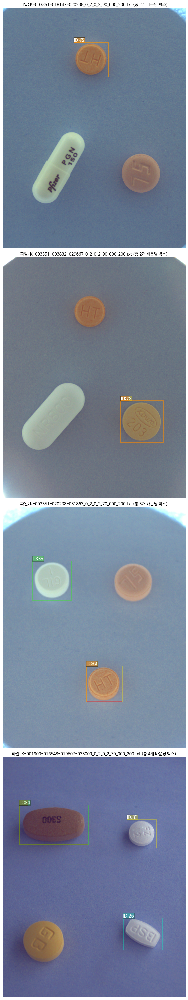

In [33]:
def visualize_specific_overlapping_boxes(image_dir, label_dir, overlapping_label_filenames):
    """
    제공된 레이블 파일 이름 목록에 해당하는 이미지와 바운딩 박스를 시각화합니다.

    Args:
        image_dir: 이미지 파일이 있는 디렉토리 경로 (예: 'path/to/your/images')
        label_dir: 레이블 파일이 있는 디렉토리 경로 (예: 'path/to/your/labels')
        overlapping_label_filenames: 시각화할 레이블 파일 이름 리스트 (예: ['K-001900-....txt', ...])
    """

    num_files = len(overlapping_label_filenames)
    if num_files == 0:
        print("시각화할 파일이 없습니다. 목록을 다시 확인해주세요.")
        return

    # 서브플롯 개수를 동적으로 설정
    fig, axes = plt.subplots(num_files, 1, figsize=(8, 10 * num_files))

    # 파일이 하나일 경우 axes가 배열이 아닌 단일 객체로 반환될 수 있으므로 리스트로 감싸줍니다.
    if num_files == 1:
        axes = [axes]

    for idx, label_filename in enumerate(overlapping_label_filenames):
        # 이미지 파일 이름 유추 (레이블 파일 이름에서 확장자만 변경)
        # 일반적인 이미지 확장자를 고려하여 `.jpg`, `.png`, `.jpeg` 순으로 시도합니다.
        base_filename = os.path.splitext(label_filename)[0]
        img_found = False
        img_path = None
        for ext in ['.jpg', '.png', '.jpeg']:
            test_img_path = os.path.join(image_dir, base_filename + ext)
            if os.path.exists(test_img_path):
                img_path = test_img_path
                img_found = True
                break

        if not img_found:
            axes[idx].set_title(f"오류: '{base_filename}'에 해당하는 이미지 파일을 찾을 수 없습니다.", color='red')
            axes[idx].axis('off')
            continue

        label_path = os.path.join(label_dir, label_filename)

        # 이미지 로드
        img = cv2.imread(img_path)
        if img is None:
            axes[idx].set_title(f"오류: '{img_path}' 이미지를 로드할 수 없습니다.", color='red')
            axes[idx].axis('off')
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape

        # 레이블 파일 로드
        if not os.path.exists(label_path):
            axes[idx].imshow(img)
            axes[idx].set_title(f"'{label_filename}' - 레이블 파일을 찾을 수 없습니다.")
            axes[idx].axis('off')
            continue

        with open(label_path, 'r') as f:
            labels = f.readlines()

        axes[idx].imshow(img)
        axes[idx].set_title(f"파일: {label_filename} (총 {len(labels)}개 바운딩 박스)")
        axes[idx].axis('off') # 축 정보 숨기기

        # 각 바운딩 박스 그리기
        for line_num, label_line in enumerate(labels):
            parts = label_line.strip().split()
            if len(parts) == 5:
                try:
                    class_id = int(parts[0])
                    x_center_norm = float(parts[1])
                    y_center_norm = float(parts[2])
                    width_norm = float(parts[3])
                    height_norm = float(parts[4])

                    # 정규화된 좌표를 실제 픽셀 좌표로 변환
                    x_center = x_center_norm * w
                    y_center = y_center_norm * h
                    bbox_width = width_norm * w
                    bbox_height = height_norm * h

                    # 바운딩 박스의 좌상단 좌표
                    x1 = int(x_center - bbox_width / 2)
                    y1 = int(y_center - bbox_height / 2)

                    # 겹치는 바운딩 박스를 더 명확하게 시각화하기 위해
                    # 각 박스에 고유한 색상 또는 패턴을 적용할 수 있습니다.
                    # 여기서는 간단하게 선의 두께와 투명도를 조절해봅니다.

                    # 무작위 색상 대신 예측 가능한 색상을 사용 (겹쳐도 알아보기 쉽게)
                    colors = plt.cm.get_cmap('hsv', 256) # 256가지 색상 맵
                    color = colors(line_num * 40 % 256) # 인덱스에 따라 다른 색상 부여

                    rect = plt.Rectangle((x1, y1), bbox_width+line_num, bbox_height+line_num,
                                         fill=False, edgecolor=color, linewidth=2 , alpha=0.4)
                    axes[idx].add_patch(rect)
                    axes[idx].text(x1, y1 - 5, f"ID:{class_id}",
                                 color='white', fontsize=13,
                                 bbox=dict(facecolor=color, alpha=0.3, pad=0.5))
                except ValueError:
                    axes[idx].text(10, 30 + line_num*20, f"레이블 파싱 오류 (라인 {line_num+1})", color='yellow', fontsize=10, backgroundcolor='red')
            else:
                axes[idx].text(10, 30 + line_num*20, f"레이블 형식 오류 (라인 {line_num+1}, {len(parts)}개 항목)", color='yellow', fontsize=10, backgroundcolor='red')

    plt.tight_layout()
    plt.show()




overlapping_boxes_filenames = [item[0] for item in overlapping_boxes]


#visualize_specific_overlapping_boxes(img_val_dir, lbl_val_dir, overlapping_boxes_filenames)
visualize_specific_overlapping_boxes(img_train_dir, lbl_train_dir, overlapping_boxes_filenames)

- K-001900-016548-019607-033009_0_2_0_2_70_000_200
    - (0:'가바토파정 100mg', 34:'신바로정')
    - 0번 클래스가 잘못됨
    - 105,868,331,1091
- K-003351-018147-020238_0_2_0_2_90_000_200
    - (49:'일양하이트린정 2mg', 72:'플라빅스정 75mg')
    - 72번 클래스가 잘못됨
    - 632,777,838,986
- K-003351-003832-029667_0_2_0_2_90_000_200
    - (7:'뉴로메드정(옥시라세탐)', 18:'리바로정 4mg')
    - 7번 클래스가 잘못됨
    - 101,664,442,1023,
    - HT 알약 (일양하이트린정, 49) 추가: 376,207,553,374,
- K-003351-029667-031863_0_2_0_2_70_000_200
    - (49:'일양하이트린정 2mg', 39:'아질렉트정(라사길린메실산염)')
    - 49번 클래스가 잘못됨
    - 382,864,553,1039
- K-003351-020238-031863_0_2_0_2_70_000_200
    - (49:'일양하이트린정 2mg', 72:'플라빅스정 75mg')
    - 72번 클래스가 잘못됨
    - 593,299,797,504
- K-003544-004543-012247-016551_0_2_0_2_70_000_200.txt
    - 45:에어탈정(아세클로페낙) ,,/ 151,873,345,1068
    - 9: '동아가바펜틴정 800mg  /127,161,402,585
    - 24: '무코스타정(레바미피드)(비매품)  /664,895,862,1094
- K-003351-016262-018357_0_2_0_2_75_000_200.txt
    - 57: '종근당글리아티린연질캡슐(콜린알포세레이트) /578,631,871,933

In [34]:
def pixel_to_normalized(x1, y1, x2, y2, img_width=976, img_height=1280):
    x_center = (x1 + x2) / 2
    y_center = (y1 + y2) / 2
    width = x2 - x1
    height = y2 - y1

    x_center_norm = x_center / img_width
    y_center_norm = y_center / img_height
    width_norm = width / img_width
    height_norm = height / img_height

    return x_center_norm, y_center_norm, width_norm, height_norm

In [35]:
def change_bbox(lbl_dir, files_to_fix):

    for filename, boxes in files_to_fix.items():

        # 각 파일의 바운딩 박스 정보 순회
        for box_info in boxes:

            label = box_info['label']
            coord = box_info['coord']

            # 수정할 좌표
            new_bbox = {
                "class": label,
                "x_center": coord[0],
                "y_center": coord[1],
                "width": coord[2],
                "height": coord[3]
                }

            # 경로 설정
            lbl_path = os.path.join(lbl_dir, filename)

            try:
                # 1. 어노테이션 파일 읽기
                with open(lbl_path, 'r') as f:
                    lines = f.readlines()

                # 2. 클래스 라벨 수정
                new_lines = []
                existing_labels = set()

                # 기존 라인 읽으며 라벨만 수집
                for line in lines:
                    parts = line.strip().split()
                    existing_labels.add(int(parts[0]))

                # 기존 라인 처리 및 좌표 변경
                for line in lines:
                    parts = line.strip().split()
                    cls = int(parts[0])
                    if label == cls:
                        # 새 좌표로 바꿈
                        new_line = f"{label} {new_bbox['x_center']} {new_bbox['y_center']} {new_bbox['width']} {new_bbox['height']}\n"
                        new_lines.append(new_line)
                    else:
                        new_lines.append(line)

                # 새 라벨 추가가 필요한 경우
                if label not in existing_labels:
                    new_line = f"{label} {new_bbox['x_center']} {new_bbox['y_center']} {new_bbox['width']} {new_bbox['height']}\n"
                    new_lines.append(new_line)

                # 3. 수정 내용을 파일에 덮어쓰기
                with open(lbl_path, 'w') as f:
                    f.writelines(new_lines)

                print(f"'{lbl_path}' 파일 내 {label}번 클래스 바운딩 박스 좌표가 정상적으로 수정됨")

            except FileNotFoundError:
                print(f"'{lbl_path}' 파일이 존재하지 않습니다. 건너뜁니다.")
            except Exception as e:
                print(f"'{lbl_path}' 처리 중 오류 발생: {e}")


In [42]:
files_to_fix = {
    'K-001900-016548-019607-033009_0_2_0_2_70_000_200.txt': [{'label':0, 'coord':pixel_to_normalized(105,868,331,1091)}],
    'K-003351-018147-020238_0_2_0_2_90_000_200.txt': [{'label':72, 'coord':pixel_to_normalized(632,777,838,986)}],
    'K-003351-003832-029667_0_2_0_2_90_000_200.txt': [{'label':7, 'coord':pixel_to_normalized(101,664,442,1023)},
                                                      {'label':49, 'coord':pixel_to_normalized(376,207,553,374)},
                                                    ],
    'K-003351-029667-031863_0_2_0_2_70_000_200.txt': [{'label':49, 'coord':pixel_to_normalized(382,864,553,1039)}],
    'K-003351-020238-031863_0_2_0_2_70_000_200.txt': [{'label':72, 'coord':pixel_to_normalized(593,299,797,504)}],
    'K-003351-016262-018357_0_2_0_2_75_000_200.txt': [{'label':57, 'coord':pixel_to_normalized(578,631,871,933)}],
    'K-003544-004543-012247-016551_0_2_0_2_70_000_200.txt': [{'label':45, 'coord':pixel_to_normalized(151,873,345,1068)},
                                                      {'label':9, 'coord':pixel_to_normalized(127,161,402,585)},
                                                      {'label':24, 'coord':pixel_to_normalized(664,895,862,1094)},
                                                    ],
}

change_bbox(lbl_train_dir, files_to_fix)

'/data/data_yolo/labels/train/K-001900-016548-019607-033009_0_2_0_2_70_000_200.txt' 파일 내 0번 클래스 바운딩 박스 좌표가 정상적으로 수정됨
'/data/data_yolo/labels/train/K-003351-018147-020238_0_2_0_2_90_000_200.txt' 파일 내 72번 클래스 바운딩 박스 좌표가 정상적으로 수정됨
'/data/data_yolo/labels/train/K-003351-003832-029667_0_2_0_2_90_000_200.txt' 파일 내 7번 클래스 바운딩 박스 좌표가 정상적으로 수정됨
'/data/data_yolo/labels/train/K-003351-003832-029667_0_2_0_2_90_000_200.txt' 파일 내 49번 클래스 바운딩 박스 좌표가 정상적으로 수정됨
'/data/data_yolo/labels/train/K-003351-029667-031863_0_2_0_2_70_000_200.txt' 파일이 존재하지 않습니다. 건너뜁니다.
'/data/data_yolo/labels/train/K-003351-020238-031863_0_2_0_2_70_000_200.txt' 파일 내 72번 클래스 바운딩 박스 좌표가 정상적으로 수정됨
'/data/data_yolo/labels/train/K-003351-016262-018357_0_2_0_2_75_000_200.txt' 파일 내 57번 클래스 바운딩 박스 좌표가 정상적으로 수정됨
'/data/data_yolo/labels/train/K-003544-004543-012247-016551_0_2_0_2_70_000_200.txt' 파일이 존재하지 않습니다. 건너뜁니다.
'/data/data_yolo/labels/train/K-003544-004543-012247-016551_0_2_0_2_70_000_200.txt' 파일이 존재하지 않습니다. 건너뜁니다.
'/data/data_yolo/l

In [43]:
overlapping_boxes = check_overlapping_boxes(lbl_train_dir, iou_threshold=0.5)

겹치는 바운딩 박스가 없습니다.


In [44]:
change_bbox(lbl_val_dir, files_to_fix)

'/data/data_yolo/labels/val/K-001900-016548-019607-033009_0_2_0_2_70_000_200.txt' 파일이 존재하지 않습니다. 건너뜁니다.
'/data/data_yolo/labels/val/K-003351-018147-020238_0_2_0_2_90_000_200.txt' 파일이 존재하지 않습니다. 건너뜁니다.
'/data/data_yolo/labels/val/K-003351-003832-029667_0_2_0_2_90_000_200.txt' 파일이 존재하지 않습니다. 건너뜁니다.
'/data/data_yolo/labels/val/K-003351-003832-029667_0_2_0_2_90_000_200.txt' 파일이 존재하지 않습니다. 건너뜁니다.
'/data/data_yolo/labels/val/K-003351-029667-031863_0_2_0_2_70_000_200.txt' 파일 내 49번 클래스 바운딩 박스 좌표가 정상적으로 수정됨
'/data/data_yolo/labels/val/K-003351-020238-031863_0_2_0_2_70_000_200.txt' 파일이 존재하지 않습니다. 건너뜁니다.
'/data/data_yolo/labels/val/K-003351-016262-018357_0_2_0_2_75_000_200.txt' 파일이 존재하지 않습니다. 건너뜁니다.
'/data/data_yolo/labels/val/K-003544-004543-012247-016551_0_2_0_2_70_000_200.txt' 파일 내 45번 클래스 바운딩 박스 좌표가 정상적으로 수정됨
'/data/data_yolo/labels/val/K-003544-004543-012247-016551_0_2_0_2_70_000_200.txt' 파일 내 9번 클래스 바운딩 박스 좌표가 정상적으로 수정됨
'/data/data_yolo/labels/val/K-003544-004543-012247-016551_0_2_0_2_70_00

### 수정한 바운딩 박스 시각화

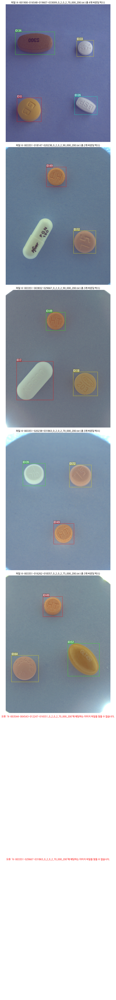

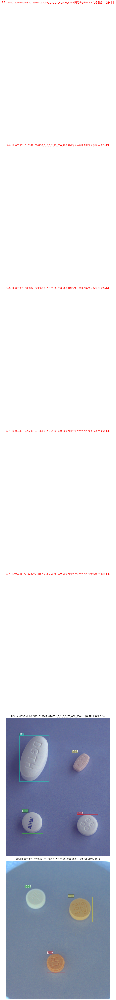

In [45]:
# 수정한 바운딩 박스 시각화
changed_bbox_files = [
    'K-001900-016548-019607-033009_0_2_0_2_70_000_200.txt',
    'K-003351-018147-020238_0_2_0_2_90_000_200.txt',
    'K-003351-003832-029667_0_2_0_2_90_000_200.txt',
    'K-003351-020238-031863_0_2_0_2_70_000_200.txt',
    'K-003351-016262-018357_0_2_0_2_75_000_200.txt',
    'K-003544-004543-012247-016551_0_2_0_2_70_000_200.txt',
    'K-003351-029667-031863_0_2_0_2_70_000_200.txt',
]


visualize_specific_overlapping_boxes(img_train_dir, lbl_train_dir, changed_bbox_files)
visualize_specific_overlapping_boxes(img_val_dir, lbl_val_dir, changed_bbox_files)